Opening an Image

In [14]:
from PIL import Image
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pytesseract


In [26]:
image_file = "data/page_01.jpg"
img = cv2.imread(image_file)


In [15]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

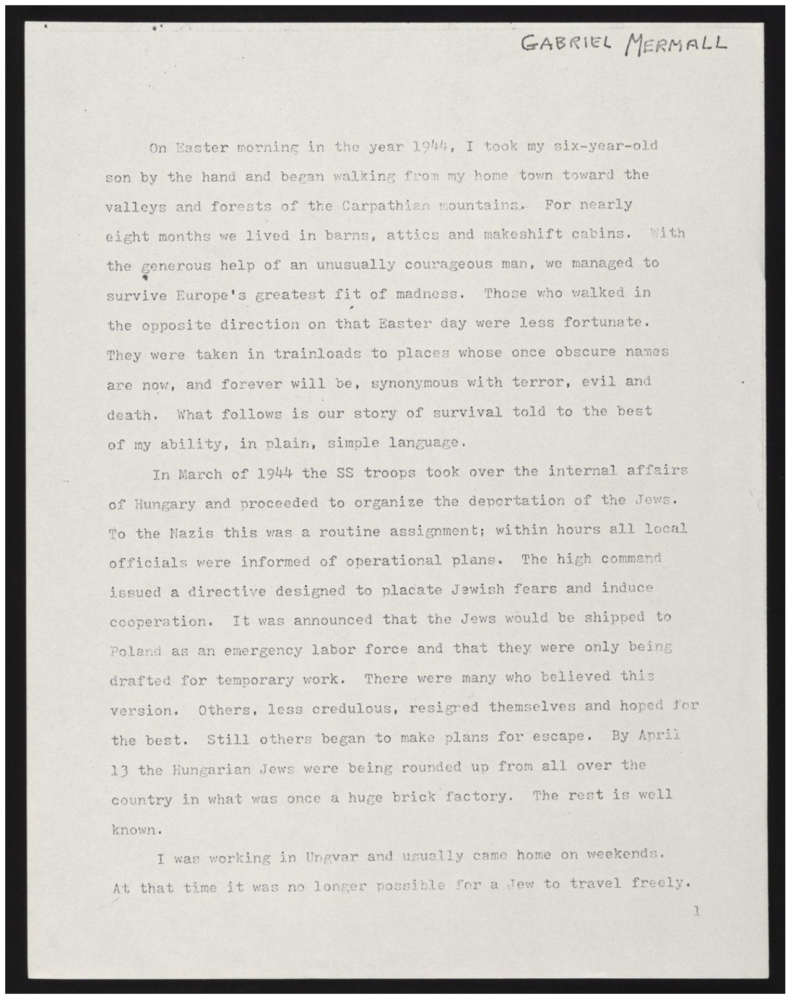

In [5]:
display(image_file)

Inverting Image

In [7]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted.jpg",inverted_image)

True

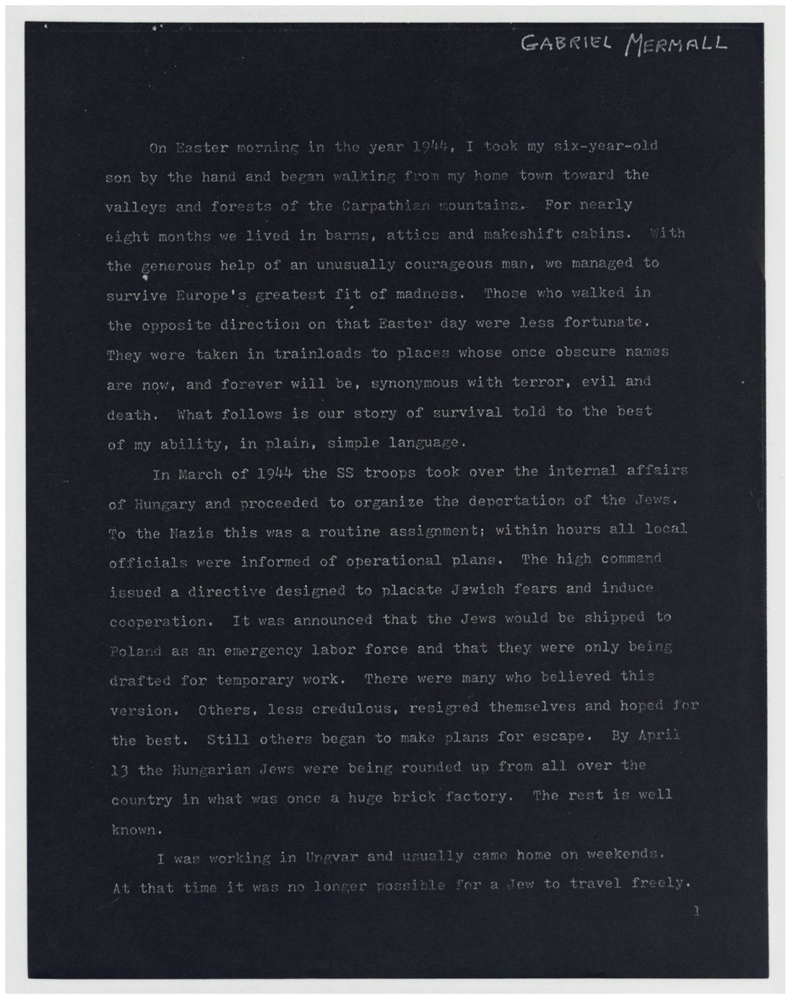

In [9]:
display("temp/inverted.jpg")

Binarization

In [49]:
def convertToGrey(image):
  return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [30]:
myimg = cv2.imread('data/page_01.jpg')
grey_image = convertToGrey(myimg)
cv2.imwrite('temp/grey_image.jpg', grey_image)

True

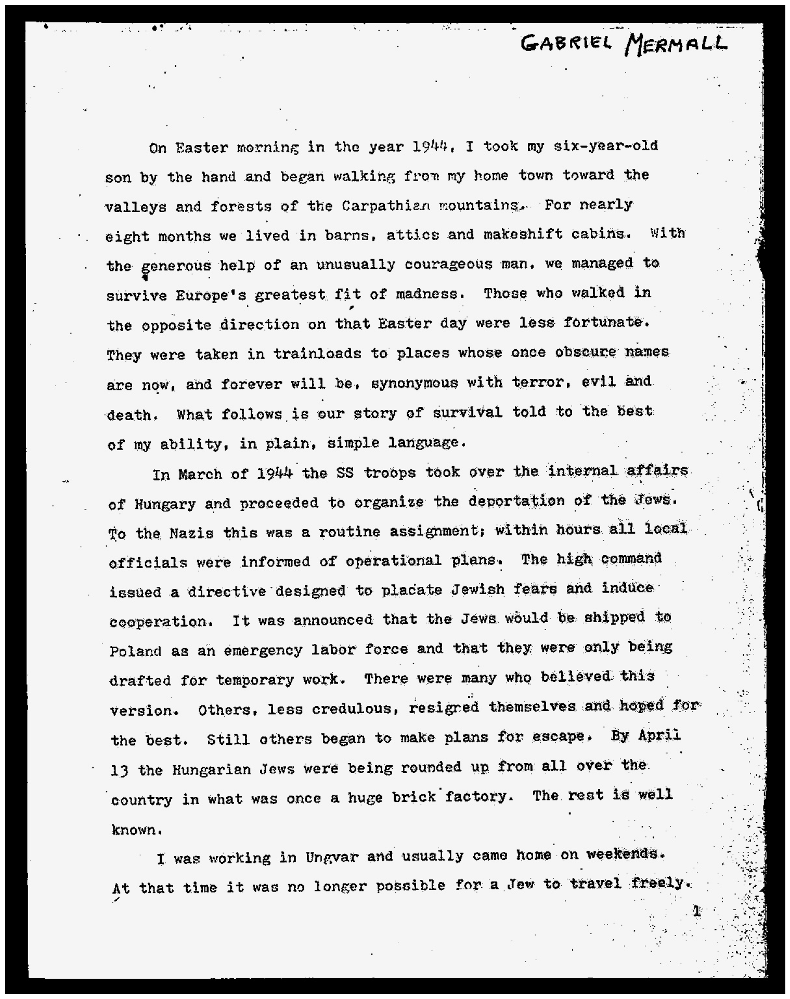

In [43]:
thresh, im_bw = cv2.threshold(grey_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite('temp/bw_image.jpg', im_bw)
display('temp/bw_image.jpg')

Noise Removal

In [45]:
def noise_removal(image):
  kernel = np.ones((1,1), np.uint8)
  image = cv2.dilate(image,kernel, iterations=1)
  kernel = np.ones((1,1), np.uint8)
  image = cv2.erode(image, kernel, iterations=1)
  image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
  image = cv2.medianBlur(image,3)
  return (image)

In [46]:
no_noise = noise_removal(im_bw)
cv2.imwrite('temp/noie_removed.jpg',no_noise)

True

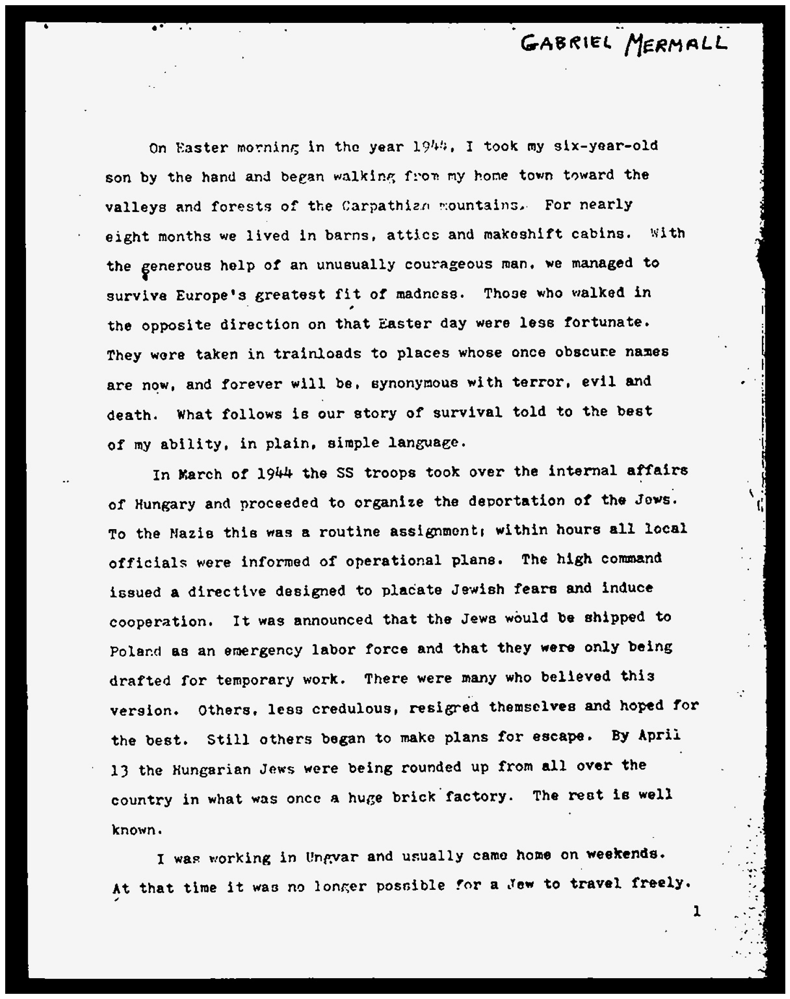

In [48]:
display("temp/noie_removed.jpg")

Dilation and Erosion

In [50]:
def thinFont(image):
  image = cv2.bitwise_not(image)
  kernel = np.ones((2,2), np.uint8)
  image = cv2.erode(image, kernel, iterations=1)
  image = cv2.bitwise_not(image)
  return (image)

In [52]:
eroded_img = thinFont(no_noise)
cv2.imwrite("temp/eroded_img.jpg",eroded_img)

True

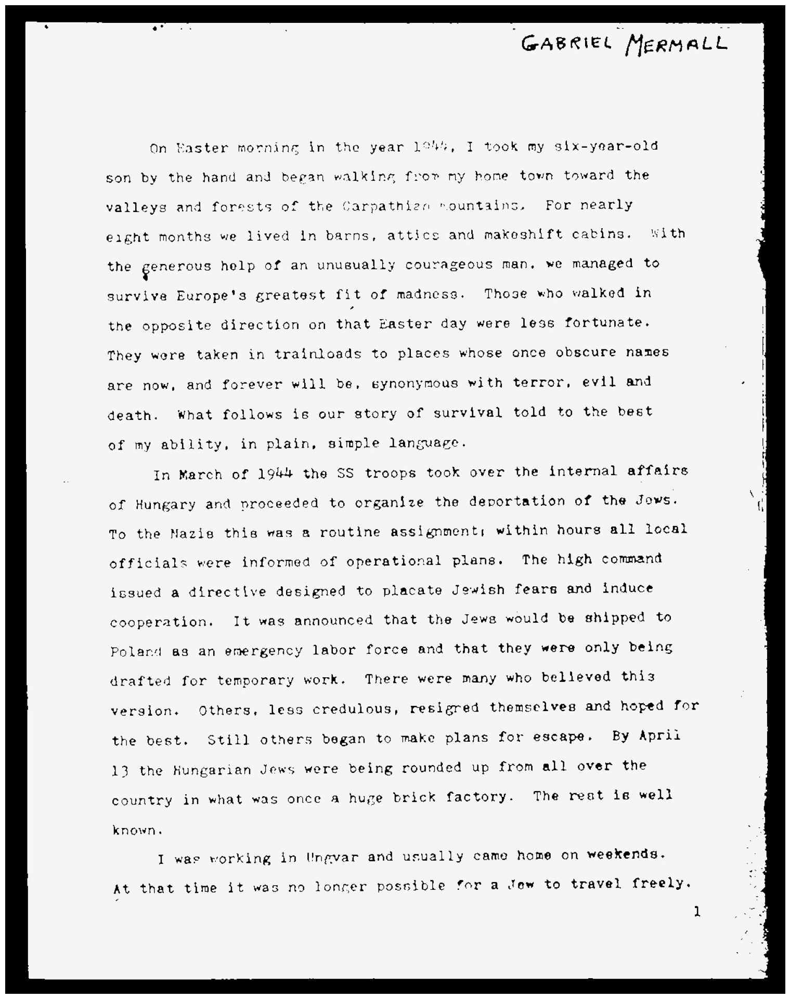

In [53]:
display("temp/eroded_img.jpg")

In [54]:
def thickFont(image):
  image = cv2.bitwise_not(image)
  kernel = np.ones((2,2), np.uint8)
  image = cv2.dilate(image, kernel, iterations=1)
  image = cv2.bitwise_not(image)
  return (image)

In [56]:
dilated_img = thickFont(no_noise)
cv2.imwrite("temp/dilated_img.jpg", dilated_img)

True

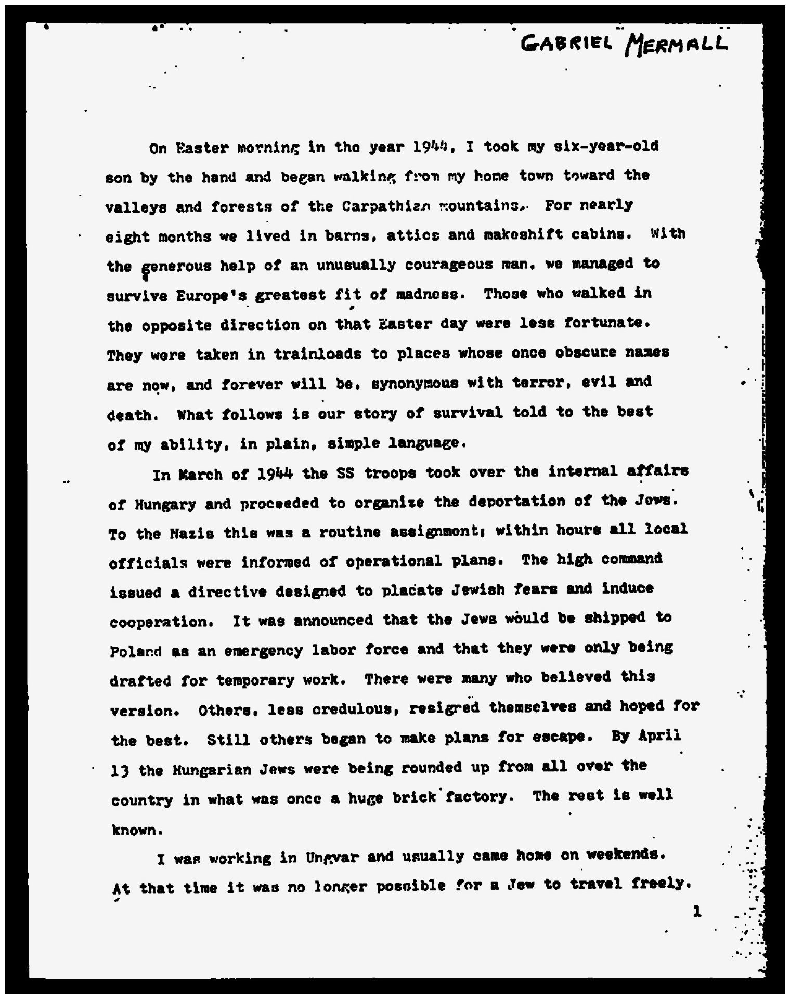

In [57]:
display("temp/dilated_img.jpg")

In [58]:
img = Image.open(image_file)


In [62]:
ocr_result = pytesseract.image_to_string(no_noise)

In [63]:
print(ocr_result)

“GABRIEL Meamall

On Easter morning in the year 194%, I took my six-year-old
son by the hand and began walking fron my home town toward the
valleys and forests of the Carpathi2n mountains. For nearly
eight months we lived in barns, attics and makeshift eabins. With
the generous nelp of an unusually courageous man, we managed to
survive Europe's greatest fit of madness. Those who walked in
the opposite direction on that Easter day were lese fortunate.
They were taken in trainloads to places whose once obscure names
are now, and forever will be, synonymous with terror, evil and
death. What follows is our story of survival told to the best
of my ability, in plain, simple language.

In March of 1944 the SS troops took over the internal affairs
of Hungary and proceeded to organize the deportation of the dows.
To the Nazie thie was a routine assignment; within hours all local
officials were informed of operational plans. The high command
issued a directive designed to placate Jewish fears an

Using Bounding boxes

In [17]:
import pytesseract
import cv2

In [18]:
image = cv2.imread('data/Body.jpeg')
grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2.imwrite("temp/Body_grey.jpeg", grey)


True

In [19]:
blur = cv2.GaussianBlur(grey, (7,7), 0)

In [20]:
cv2.imwrite("temp/blur_Body.jpeg", blur)

True

In [21]:
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
cv2.imwrite("temp/thresh_Body.jpeg", thresh)


True

In [22]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,13))

In [23]:
cv2.imwrite("temp/kernel_Body.jpeg", kernel)

True

In [31]:
dilate = cv2.dilate(thresh,kernel, iterations=5)

In [32]:
cv2.imwrite("temp/Body_dilate.jpeg", dilate)

True

In [33]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

cnts = cnts[0] if len(cnts) == 2 else cents[1]


In [34]:
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])


In [35]:

results  = []
for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    if h > 200 and w > 20:
        roi = image[y:y+h, x:x+h]
        cv2.rectangle(image, (x, y), (x+w, y+h), (36, 255, 12), 2)
        ocr_result = pytesseract.image_to_string(roi)
        ocr_result = ocr_result.split("\n")
        for item in ocr_result:
            results.append(item)
cv2.imwrite("temp/Body_bbox_new.png", image)

True

In [30]:
print (results)


['alamus Pineal giana', '', '2H, GHRH Melatonin', '', 'ne', '', 'statin Pituitary gland', '', 'Ssin GH, TSH, ACTH', '', '_ FSH, MSH, LH', '', 'oid Prolactin, Oxytocin', '', 'Calcitonin Vasopressin', 'hymus', 'hymopoietin', '', 'PO', 'Stomach', '', 'Gastrin, Ghrelin', 'Histamine', 'Somatostatin', 'Neuropeptide Y', '', 'INS', 'rticoids', 'ine', 'naline', 'I, Renin', 'oletin', '(_\\', '', '2NS Q', '', 'I, Inhibin', '', 'Pancreas', 'Insulin, Glucagon', 'Somatostatin', 'Ovary, Placenta', '', 'Estrogens', 'Progesterone', 'Uterus', '', 'Prolactin, Relaxin', '', '', '', '', '', '', '', '', '', '']
